In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
# dst_data_path  = '/Volumes/data/swfpy/ml/storm_datasets/basic/DST/storm_DST_2003111923_2003112414.csv'
# omni_data_path = '/Volumes/data/swfpy/ml/storm_datasets/basic/omni/storm_OMNI_2003111923_2003112414.csv'


# dst_df  = pd.read_csv(dst_data_path)
# omni_df = pd.read_csv(omni_data_path)


In [3]:
def intYMDh_2_strYMDhm(int_ymhd):
    dt = datetime.strptime(str(int_ymhd), '%Y%m%d%H')
    return dt
                           
def intYMDhm_2_strYMDhm(int_ymhd):
    dt = datetime.strptime(str(int_ymhd), '%Y%m%d%H%M')
    return dt


In [162]:
# dst_df['Time'] = dst_df['Time'].apply(intYMDh_2_strYMDhm)

# # OMNIデータの整形: T はNaNに、NaNは線形補完

# omni_df.loc[omni_df['T'] == 9999999.0, 'T'] = np.nan
# omni_df[omni_df['Vx'].isnull()]


# omni_df = omni_df.interpolate(method='linear')
# omni_df['Time'] = omni_df['Time'].apply(intYMDhm_2_strYMDhm)


In [202]:
import pandas_bokeh
pandas_bokeh.output_notebook()
from bokeh.plotting import figure, output_file, show,output_notebook
from bokeh.models import DatetimeTickFormatter
from bokeh.layouts import gridplot
from bokeh.io import export_png, export_svgs

Loading BokehJS ...

In [208]:
f1 = figure(title="November 2013 Storm Event", y_axis_label='DST [nT]', x_axis_type='datetime',
          plot_width=800, plot_height=150, output_backend='svg')
f1.line(dst_df['Time'], dst_df['DST[nT]'], line_width=2)
f1.xaxis.major_label_text_font_size = '0pt'

f2 = figure(y_axis_label='Vx [km/s]', x_axis_type='datetime',
          plot_width=800, plot_height=150, output_backend='svg')
f2.line(omni_df['Time'], omni_df['Vx'], line_width=2, line_color='black')
f2.xaxis.major_label_text_font_size = '0pt'

f3 = figure(y_axis_label='Bz_GSM [nT]', x_axis_type='datetime',
          plot_width=800, plot_height=150, output_backend='svg')
f3.line(omni_df['Time'], omni_df['BZ_GSM'], line_width=2, line_color='red')
f3.xaxis.major_label_text_font_size = '0pt'

f4 = figure(y_axis_label='By_GSM [nT]', x_axis_type='datetime',
          plot_width=800, plot_height=150, output_backend='svg')
f4.line(omni_df['Time'], omni_df['BY_GSM'], line_width=2, line_color='green')
f4.xaxis.major_label_text_font_size = '0pt'

f5 = figure(y_axis_label='N [cm^-3]', x_axis_type='datetime',
          plot_width=800, plot_height=150, output_backend='svg')
f5.line(omni_df['Time'], omni_df['proton_density'], line_width=2, line_color='blue')
f5.xaxis.major_label_text_font_size = '0pt'

f6 = figure(x_axis_label='DateTime', y_axis_label='T [K]', x_axis_type='datetime',
          plot_width=800, plot_height=190, output_backend='svg')
f6.line(omni_df['Time'], omni_df['T'], line_width=2, line_color='gray')

f_all = gridplot([[f1], [f2], [f3], [f4], [f5], [f6]])

show(f_all)

In [11]:
def make_storm_event_figures(dst_df, omni_df, img_dir = '.'):
    from_time = str(dst_df['Time'][0])
    to_time   = str(dst_df['Time'][dst_df['Time'].size-1])

    fig, axes = plt.subplots(1+omni_df.columns[1:].size, 1, figsize=(14,15), sharex=True)

    axes[0].plot(dst_df['Time'], dst_df['DST[nT]'], label='DST[nT]', color='black')
    axes[0].grid()
    axes[0].set_title('Storm Event (' + from_time + ' ~ ' + to_time + ')')
    axes[0].set_ylabel('DST[nT]')

    unit_map  = {'Vx': ' [km/s]', 'BZ_GSM': ' [nT]', 'BY_GSM': ' [nT]', 'N': ' [cm^-3]', 'T': ' [K]'}
    color_map = {'Vx': 'red', 'BZ_GSM': 'blueviolet', 'BY_GSM': 'b', 'proton_density': 'limegreen', 'T': 'peru'}

    for i, var in enumerate(omni_df.columns[1:]):
        axes[i + 1].plot(omni_df['Time'], omni_df[var], color=color_map[var])
        if var == 'proton_density': var = 'N'
        axes[i + 1].set_ylabel(var + unit_map[var])
        axes[i + 1].grid()

        if var == 'T':
            axes[i + 1].set_yscale('log')

    plt.savefig(img_dir + 'Strom_Event_' + from_time + '_' + to_time + '.png')
    
    
def make_storm_event_figures2(dst_df, omni_df, img_dir = '.'):
    from_time = str(dst_df['Time'][0])
    to_time   = str(dst_df['Time'][dst_df['Time'].size-1])

    fig, axes = plt.subplots(1+omni_df.columns[1:].size, 1, figsize=(14,15), sharex=True)

    axes[0].plot(dst_df['Time'], dst_df['DST[nT]'], label='DST[nT]', color='black')
    axes[0].grid()
    axes[0].set_title('Storm Event (' + from_time + ' ~ ' + to_time + ')')
    axes[0].set_ylabel('DST[nT]')

    unit_map  = {'V': ' [km/s]', 'BZ_GSM': ' [nT]', '|B|': ' [nT]', 'N': ' [cm^-3]'}
    color_map = {'flow_speed': 'red', 'BZ_GSM': 'blueviolet', 'F': 'b', 'proton_density': 'limegreen'}

    for i, var in enumerate(omni_df.columns[1:]):
        print(omni_df.columns)
        axes[i + 1].plot(omni_df['Time'], omni_df[var], color=color_map[var])
        if var == 'proton_density': var = 'N'
        if var == 'flow_speed': var = 'V'
        if var == 'F': var = '|B|'
        axes[i + 1].set_ylabel(var + unit_map[var])
        axes[i + 1].grid()

        if var == 'T':
            axes[i + 1].set_yscale('log')

    plt.savefig(img_dir + 'Strom_Event_' + from_time + '_' + to_time + '.png')
    
    
    
#     plt.show()

plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2000021123_2000021411.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2000040607_2000040921.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2000052316_2000052707.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'],

plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2001102718_2001110101.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')


/home/hirotoshi/PycharmProjects/swfpy/venv/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2001103110_2001110313.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2001110510_2001111019.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2001112321_2001112719.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'],

plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2004082920_2004090212.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2004110711_2004111614.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2005050713_2005051113.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'],

plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2013053116_2013060420.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2013062801_2013070209.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'], dtype='object')
plotting...: /Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/storm_DST_2014021806_2014022316.csv
Index(['Time', 'flow_speed', 'BZ_GSM', 'F', 'proton_density'],

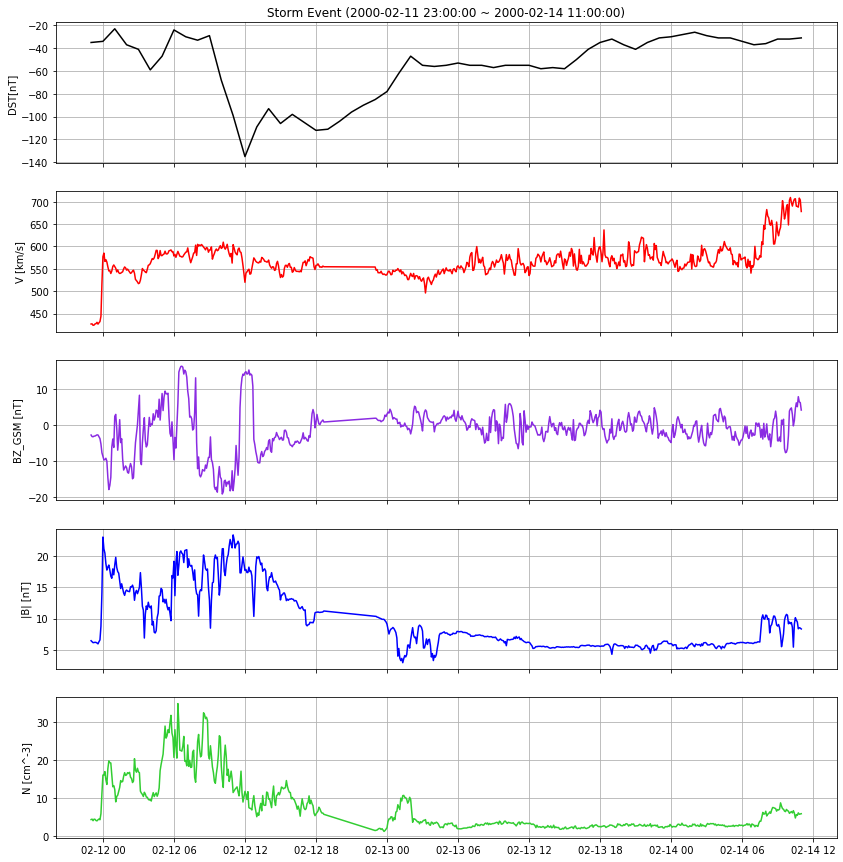

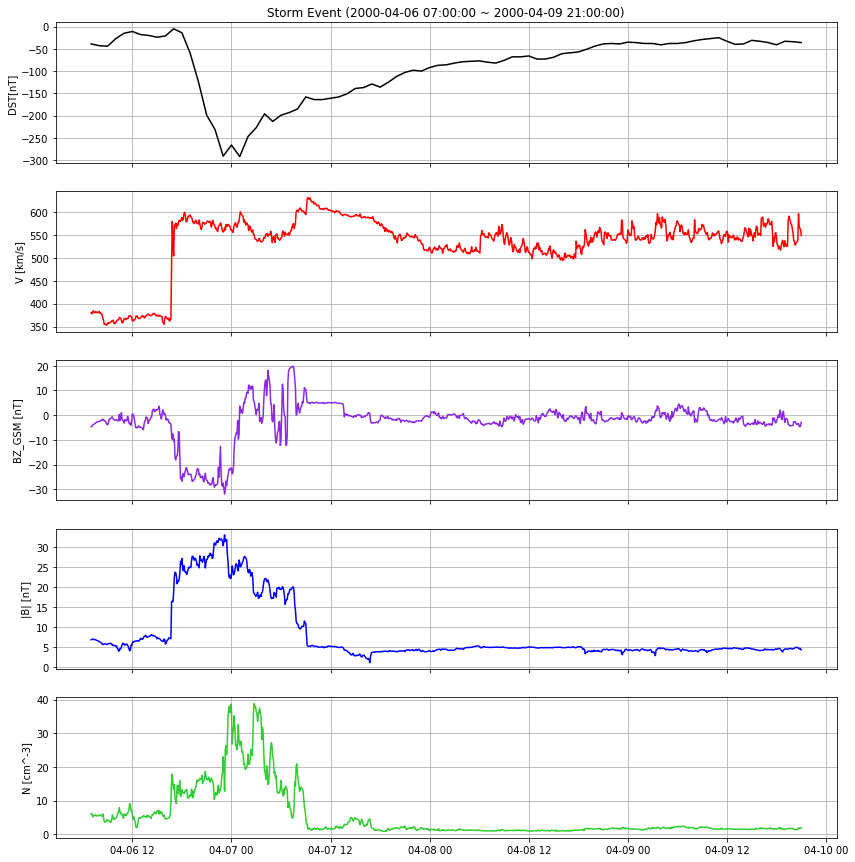

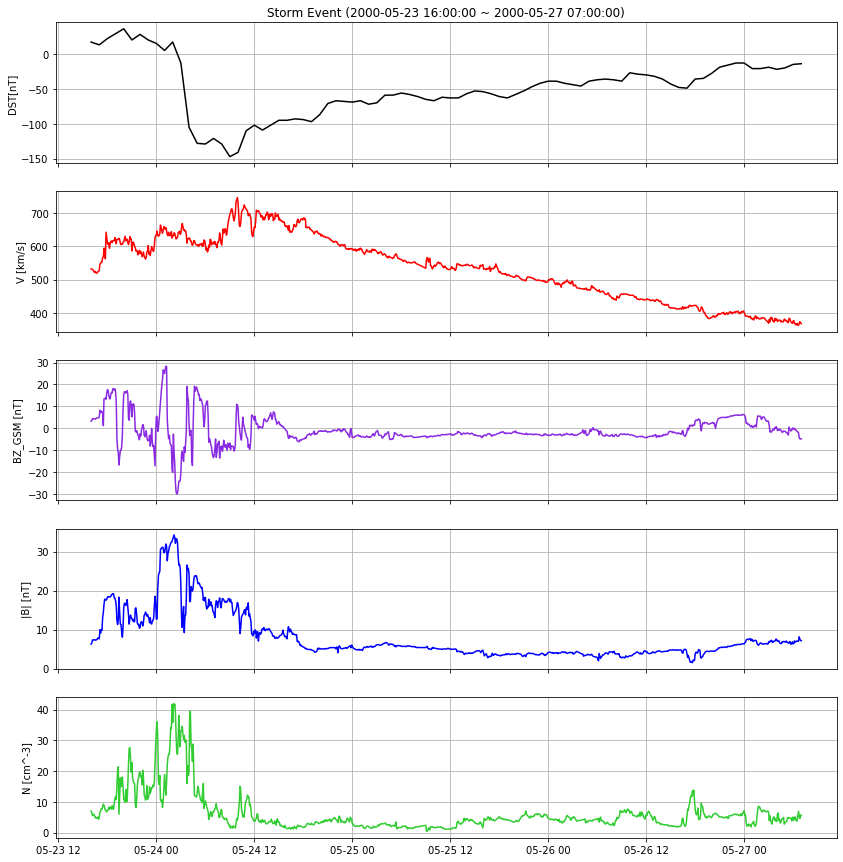

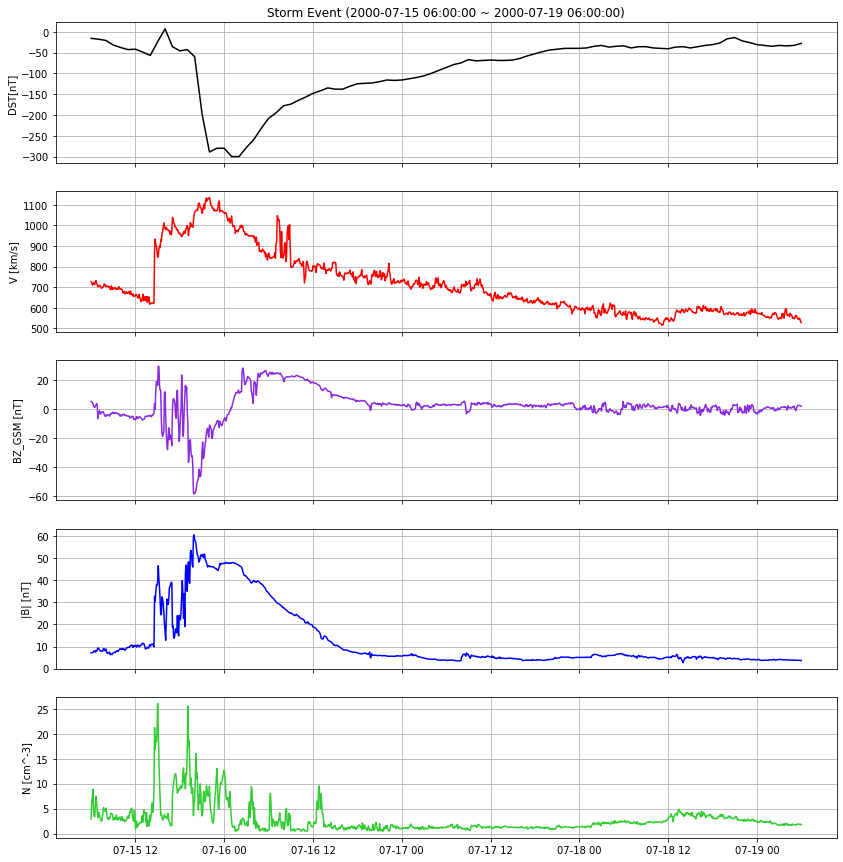

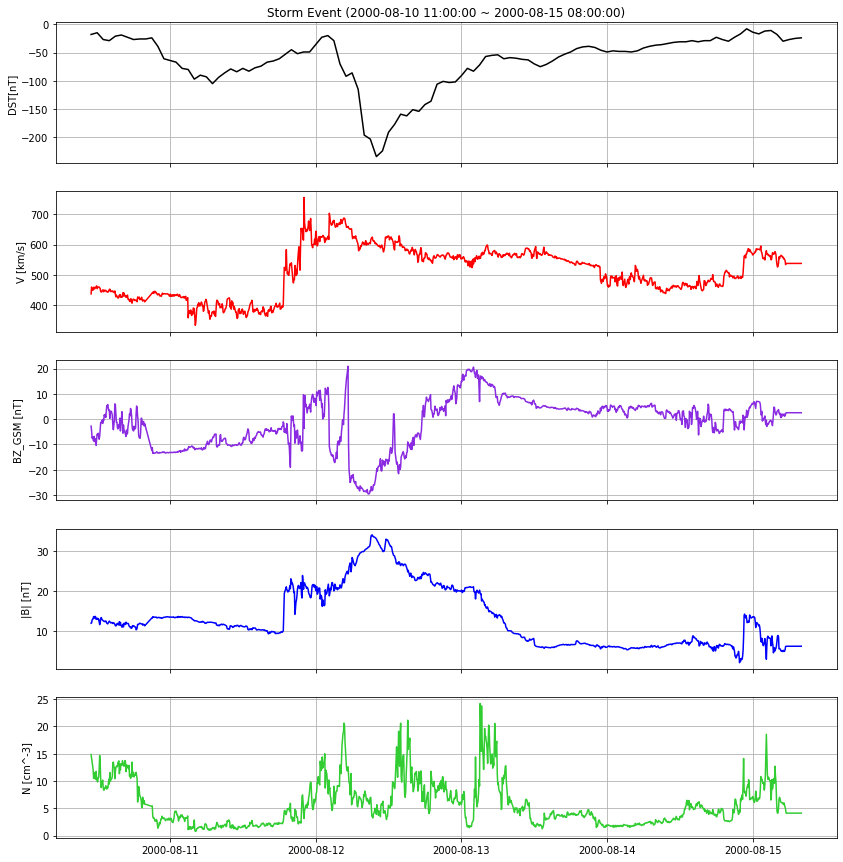

...

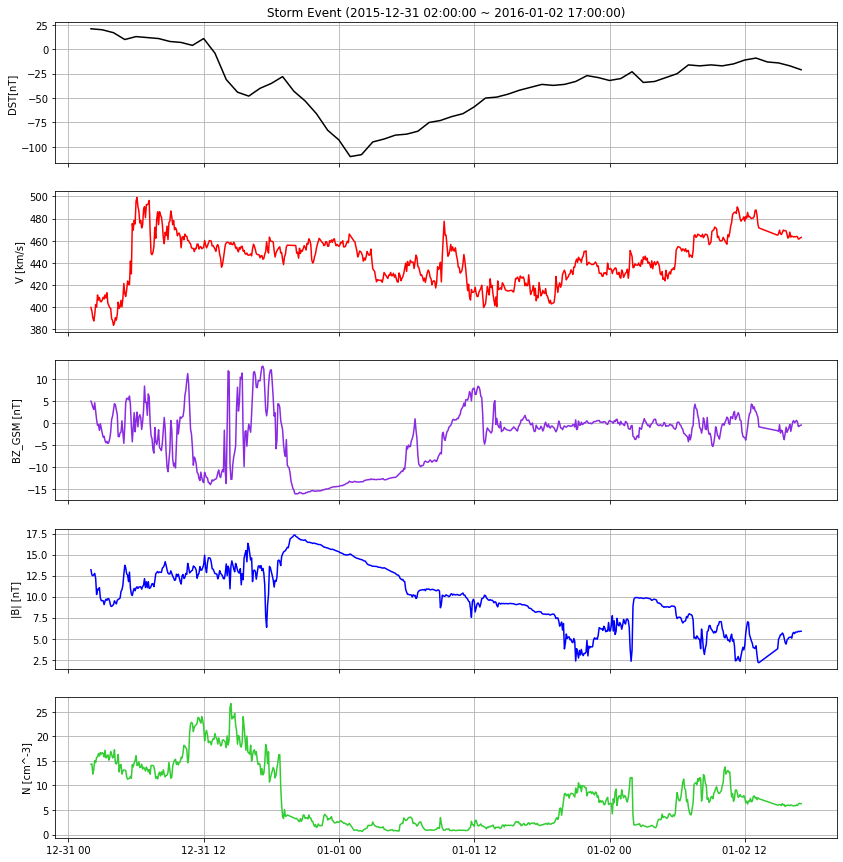

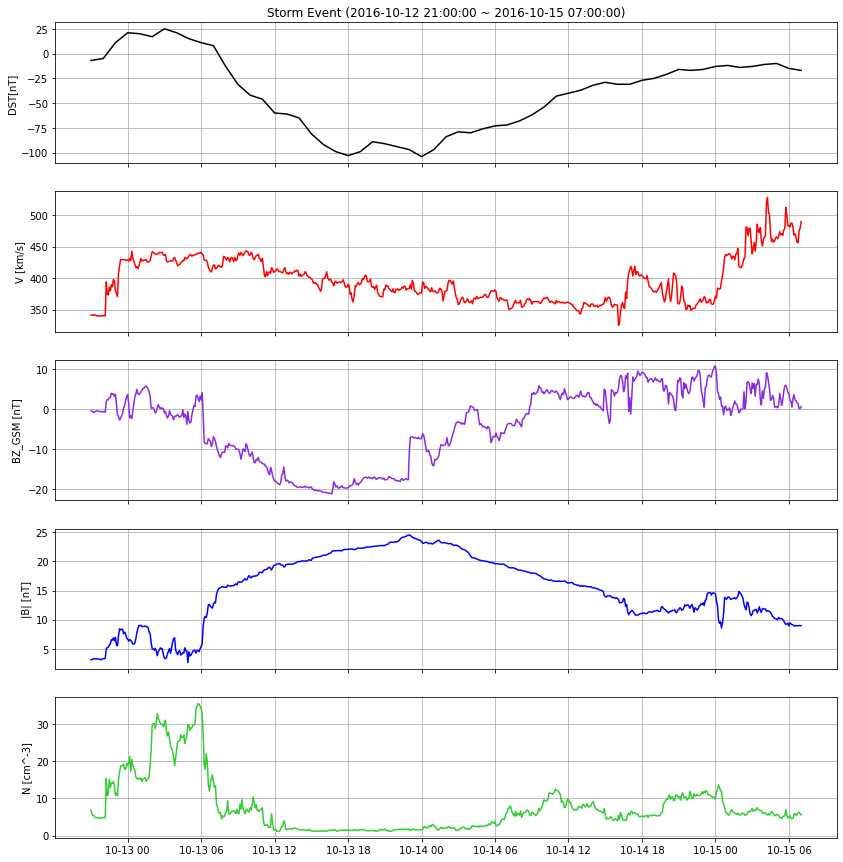

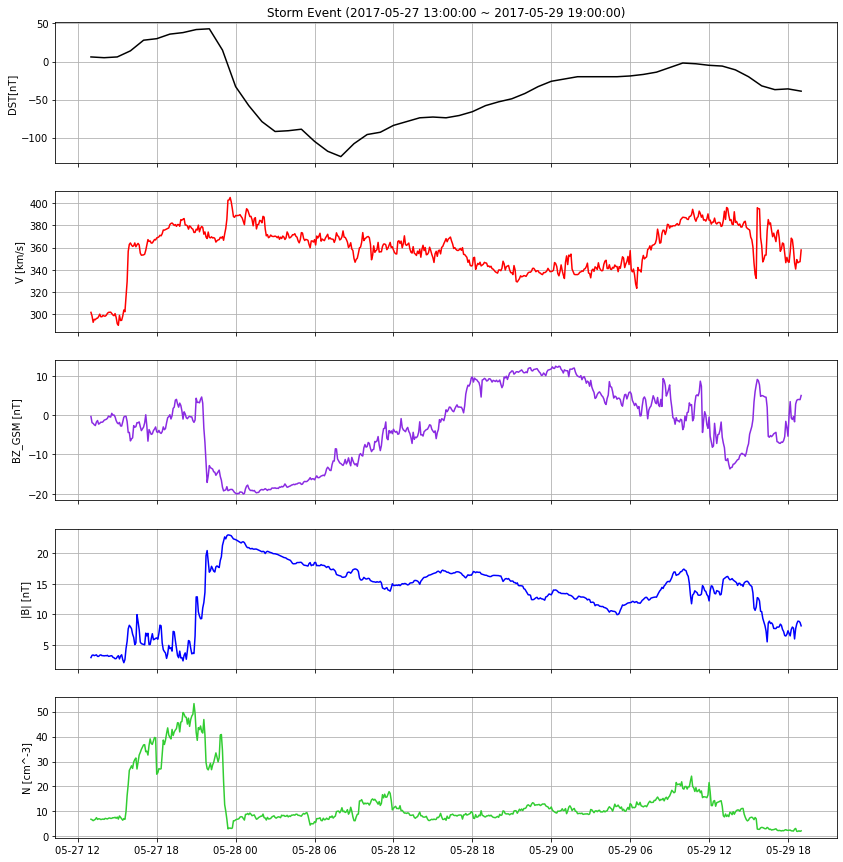

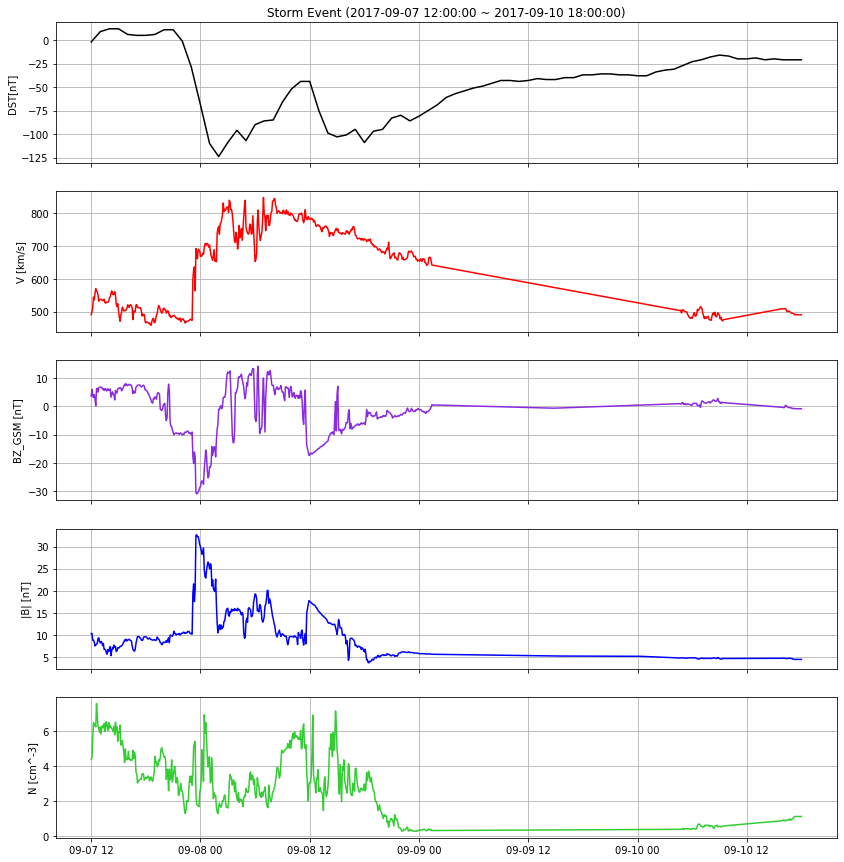

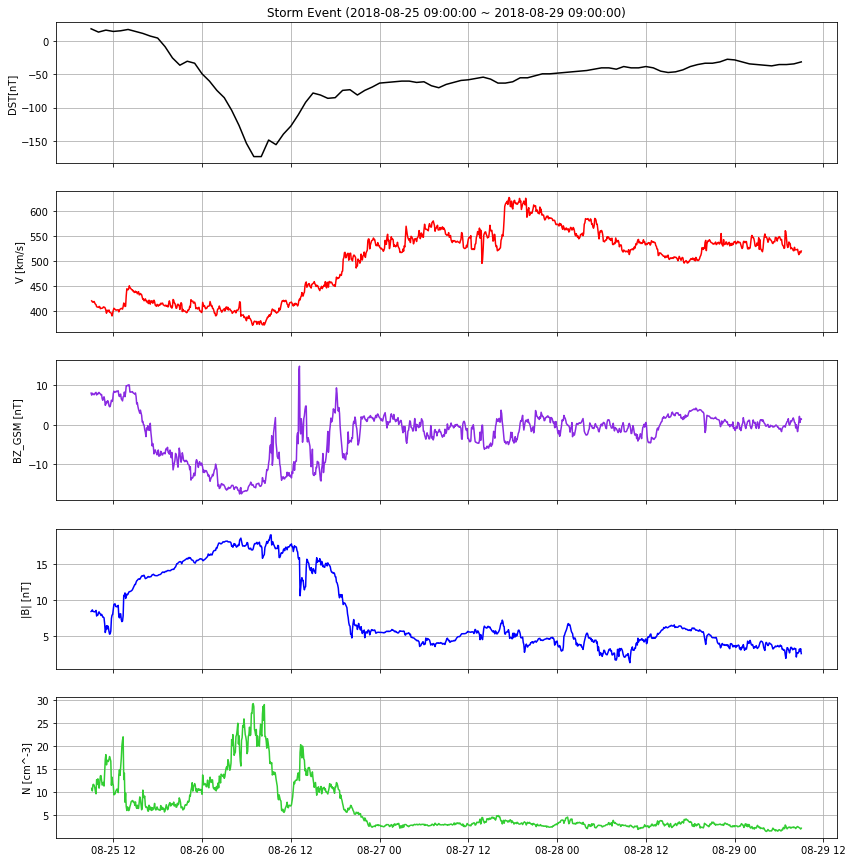

In [12]:
from glob import glob
img_dir = '/home/hirotoshi/PycharmProjects/swfpy/playground/imgs/Gruet_2018/'
# dst_data_path  = '/Volumes/data/swfpy/ml/storm_datasets/basic/DST/storm_DST_2003111923_2003112414.csv'
# omni_data_path = '/Volumes/data/swfpy/ml/storm_datasets/basic/omni/storm_OMNI_2003111923_2003112414.csv'
# dst_data_dir  = '/Volumes/data/swfpy/ml/storm_datasets/basic/DST/'
# omni_data_dir = '/Volumes/data/swfpy/ml/storm_datasets/basic/omni/'
dst_data_dir  = '/Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/DST/'
omni_data_dir = '/Volumes/data/swfpy/ml/storm_datasets/Gruet_2018/omni_5min/'

dst_data  = sorted(glob(dst_data_dir + '*'))
omni_data = sorted(glob(omni_data_dir + '*'))

for dst_data_path, omni_data_path in zip(dst_data, omni_data):

    dst_df  = pd.read_csv(dst_data_path)
    omni_df = pd.read_csv(omni_data_path)

    dst_df['Time'] = dst_df['Time'].apply(intYMDh_2_strYMDhm)

    # OMNIデータの整形: T はNaNに、NaNは線形補完
#     omni_df.loc[omni_df['T'] == 9999999.0, 'T'] = np.nan

    omni_df = omni_df.interpolate(method='linear')
    omni_df['Time'] = omni_df['Time'].apply(intYMDhm_2_strYMDhm)
    
    
    print('plotting...: '+ dst_data_path)
#     make_storm_event_figures(dst_df, omni_df, img_dir)
    make_storm_event_figures2(dst_df, omni_df, img_dir)
    